# Counting text similarity 

### Colab setup

In [ ]:
!nvidia-smi

Mon Dec 20 17:53:25 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   70C    P8    36W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Will be using [Sentence Transformers](https://github.com/UKPLab/sentence-transformers)[](https://)

In [4]:
!pip install -U sentence-transformers

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Imports

In [5]:
import json
import os
#from google.colab import drive
from tqdm import tqdm
import pickle
from collections import Counter

import pandas as pd

import numpy as np
import scipy
from scipy import spatial

from sentence_transformers import SentenceTransformer

from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Pretrained model

Скачиваем предобученную модель

In [6]:

model = SentenceTransformer('bert-base-nli-mean-tokens') #эта быстрее
#model = SentenceTransformer('bert-large-nli-mean-tokens') #эта точнее


Downloading:   0%|          | 0.00/391 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.95k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/625 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/399 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

# Load data from Google Drive

In [ ]:
df_trump = pd.read_csv("/content/drive/MyDrive/TrumpBidenDataset/Trump_comments_2020_clean.csv")
df_biden = pd.read_csv("/content/drive/MyDrive/TrumpBidenDataset/JoeBiden_comments_2020_clean.csv")
document = ['Trump', 'Biden']
df_trump['target'] = 0
df_biden['target'] = 1
df = pd.concat((df_trump, df_biden), axis = 0)

## Embeddings for comments


Vectorization of sample

In [ ]:
%%time
comments_df = df.sample(500000)  # small sample example
comment_embedding = model.encode(comments_df['body'].to_list(), device='cuda')
comments_df['embedding'] = list(comment_embedding)

In [ ]:
comments_df.head()

### Save table with embeddings

In [7]:
with open('/content/drive/My Drive/TrumpBidenDataset/comments_df.pickle', 'wb') as f:
  pickle.dump(comments_df, f)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/TrumpBidenDataset/comments_df.pickle'

# Setting vectors related to topic

In [8]:
%%time
trump_ref_texts = (
'This is why we need Trump to win. With the USA as  trendsetter, we can purge the traitors from office!',
'Bitcoin will soon be called Trump Coin it’ll be so great!',
'Daddy Trump is gonna make Daycare Great Again!',
'they was hoping trump would give them a boost in california. the tears are delicious',
'Flawless Centipede... Submit to @Twinksfortrump and follow @Gay4Trump',
'But if Bernie debates trump and a meteorite hit Hillary then sanders will win! Remember guys phone bank, donate, match me',
'edited because i was a tool, and edited to say LostTrumpSupporter is AWESOME!',
'my best tips are almost always from trump supporters. i guess when youre employed you can afford to be a generous person',
'And it will work, until Trump makes America so fucking awesome nobody would want to change it.',
'Poseidon is doing his best to protect the West.  Thank you based Poseidon.',
'Trump/Poseidon 2016',
'Probably made a script to respond to all of Trump’s newest tweets with pre-written tweets. He’s an impressive centipede!',
'Donald Trump is best',
'Trump has a diet for this country and trust me it’s gonna be nutritious and delicious',
'Mr. Trump all we do is win i need a break!',
'Babes are awesome so are Trump fellas.',
'That’s a cuck way of looking at it, Trump **WILL WIN 50+DC**!',
'Trump Tower has the best taco bowls.',
"immigrants are bad",
"Immigrants will take American jobs, lower our wages, and especially hurt the poor",
"Immigrants abuse the welfare state",
"Immigrants increase the budget deficit and government debt",
"Immigrants increase economic inequality",
"Today’s immigrants don’t assimilate like immigrants from previous waves did",
"Immigrants are a major source of crime",
"Immigrants pose a unique risk today because of terrorism",
"It’s easy to immigrate to America and we’re the most open country in the world",
"Amnesty or a failure to enforce our immigration laws will destroy the Rule of Law in the United States",
"By not exercising control over borders through actively blocking immigrants, the users of this argument warn, the United States government will surrender a vital component of its national sovereignty",
"Immigrants won’t vote for the Republican Party",
"Immigrants bring with them their bad cultures, ideas, or other factors that will undermine and destroy our economic and political institutions.  The resultant weakening in economic growth means that immigrants will destroy more wealth than they will create over the long run",
"The brain drain of smart immigrants to the United State impoverished other countries",
"Immigrants will increase crowding, harm the environment",
'Hey man im in north jersey as well. I wear my MAGA gear with pride and drive around with my trump bumper sticker. Im in morris county. Dont let the libs win. Trump 2016!!!',
'I’m not asking for a VP that is lockstep with Trump. But accepting a VP who was a prime mover in the passage of one of the greatest frauds foisted upon the US ever is NOT acceptable as VP. VP is a heartbeat from POTUS',
'The official Donald Trump MAGA cap is the one the Don himself wears. It’s the one I bought, and let me tell you folks, it is the best hat around, the best, believe me.'
)
# reference_texts = ("immigrants are bad",
#                    "Immigrants will take American jobs, lower our wages, and especially hurt the poor",
#                    "Immigrants abuse the welfare state",
#                    "Immigrants increase the budget deficit and government debt",
#                    "Immigrants increase economic inequality",
#                    "Today’s immigrants don’t assimilate like immigrants from previous waves did",
#                    "Immigrants are a major source of crime",
#                    "Immigrants pose a unique risk today because of terrorism",
#                    "It’s easy to immigrate to America and we’re the most open country in the world",
#                    "Amnesty or a failure to enforce our immigration laws will destroy the Rule of Law in the United States",
#                    "By not exercising control over borders through actively blocking immigrants, the users of this argument warn, the United States government will surrender a vital component of its national sovereignty",
#                    "Immigrants won’t vote for the Republican Party",
#                    "Immigrants bring with them their bad cultures, ideas, or other factors that will undermine and destroy our economic and political institutions.  The resultant weakening in economic growth means that immigrants will destroy more wealth than they will create over the long run",
#                    "The brain drain of smart immigrants to the United State impoverished other countries",
#                    "Immigrants will increase crowding, harm the environment")

# reference_texts = ("my cat is nice"
#                   )
    

trump_ref_vecs = model.encode(trump_ref_texts)

Wall time: 5.75 s


# Sanity Check

In [9]:
text_texts_simple = (
    # "Westgate-on-Sea is a seaside town and civil parish in northeast Kent, England, with a population of 6,996 at the 2011 Census. It is within the Thanet local government district and borders the larger seaside resort of Margate. Its two sandy beaches have attracted tourists since the town's development in the 1860s from a small farming community. The local St Mildred's Bay was the site of a Royal Naval Air Service seaplane base, which defended the Thames Estuary coastal towns during World War I.",
    # "Bean is one of the silliest dogs I have ever met. She is always managing to get in trouble somehow or at the very least getting into some kind of mischief. She makes me laugh when she gets excited and she makes me laugh when she falls asleep in the strangest positions. It feels like no matter what Bean is doing, I always manage to laugh for some reason.",
    # "It’s a lot of work to own a dog, but I’ve also never been in greater shape in my life. Bean reminds me to get up, get outside, and exercise through our walks. What’s great is that Bean also exercises my mind as well! Training her can be hard work sometimes and I’m always trying to come up with new ways to handle and entertain her.",
    # "Most dogs are dirty and smelly. You can literally smell when someone owns a furry creature. Maintenance of their hygiene requires time and money that I do not have. On top of that, dogs never leave you alone. Maybe it’s my inner introvert talking, but I don’t want to come home to a dog sticking its nose in my business and begging for attention. I want peace, quiet and solitude.",
    # "For myself, I don’t think there’s any question that Donald Trump is a very imperfect vessel and that everyone wishes he did many things differently.  And I think Trump’s election was just as much, if not more, about Barak Obama’s left-wing overreach and Hilary Clinton’s spectacular flaws, as it was about Trump’s skill in articulating the dramatic change that resonated with middle America.  I am thankful that his campaign found a path to victory, and I think, policywise, he is on his way to becoming one of our greatest presidents.",
    "Trump's margin of victory was extremely narrow. If that suggests anything at all, it suggests that a single major factor breaking Clinton's way instead of Trump's would have flipped the election. Russian interference was a major factor. It wasn't the only major factor, and Clinton still could have won, but she also *would* have won had Putin not interfered.",
    "Trump bad!",
    "Trump is the best!",
    "Hillary is the best!",
    "immigrants are bad"

)

In [10]:
text_texts_simple_vecs = model.encode(text_texts_simple)

In [ ]:
text_texts_simple_labels = list()
for i in text_texts_simple:
  text_texts_simple_labels.append(i[:50])
  print(text_texts_simple_labels)
  print("\n")

["Trump's margin of victory was extremely narrow. If"]


["Trump's margin of victory was extremely narrow. If", 'Trump bad!']


["Trump's margin of victory was extremely narrow. If", 'Trump bad!', 'Trump is the best!']


["Trump's margin of victory was extremely narrow. If", 'Trump bad!', 'Trump is the best!', 'Hillary is the best!']


["Trump's margin of victory was extremely narrow. If", 'Trump bad!', 'Trump is the best!', 'Hillary is the best!', 'immigrants are bad']




In [ ]:
text_texts_simple_vecs

array([[-1.0945894 , -0.01131582, -0.96482974, ..., -0.20393789,
        -0.43765992,  0.64301974],
       [ 0.0122357 ,  0.5221702 ,  1.1257786 , ..., -0.6146365 ,
         0.14970097, -0.21863794],
       [-0.6463699 ,  0.1748924 ,  1.1177336 , ..., -0.14349543,
         0.1352401 , -0.06210774],
       [-0.57031983,  0.38709804,  1.2921928 , ..., -0.0894141 ,
         0.08369426,  0.46866336],
       [-0.0238545 ,  0.6589504 ,  0.30720395, ..., -0.63858986,
        -0.32460737, -0.07390022]], dtype=float32)

In [ ]:
cos_sim = cosine_similarity(text_texts_simple_vecs)

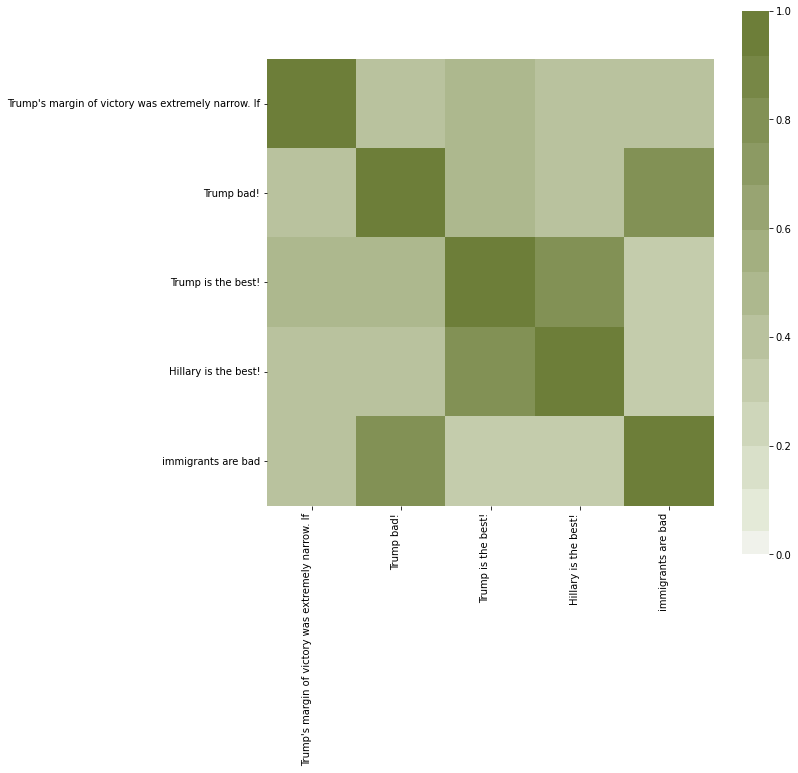

In [ ]:
plt.subplots(figsize=(10,10))
ax = sns.heatmap(
    cos_sim, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(10, 100, n=25),
    square=True,
    
)
ax.set_xticklabels(
    text_texts_simple_labels,
    rotation=90,
    horizontalalignment='right'
);

ax.set_yticklabels(
    text_texts_simple_labels,
    rotation=00,
    horizontalalignment='right'
);

# Data analysis

Load table with embeddings

In [ ]:
os.listdir("/content/drive/My Drive/TrumpBidenDataset/")


['Trump_comments_2020_clean.csv',
 'JoeBiden_comments_2020_clean.csv',
 'comments_df.pickle']

In [ ]:
%%time
comments_df = pd.DataFrame()
tmp = pd.DataFrame()
with open('/content/drive/My Drive/TrumpBidenDataset/comments_df.pickle', mode='rb') as pandas_file:
    tmp = pickle.load(pandas_file)
    comments_df = comments_df.append(tmp)
del(tmp)

CPU times: user 3.56 s, sys: 1.72 s, total: 5.28 s
Wall time: 20.5 s


In [ ]:
print('Dataset shape:', comments_df.shape)
comments_df.tail()

Dataset shape: (500000, 9)


,Unnamed: 0,author,body,created_utc,link_id,parent_id,score,doc,embedding
61540,61540,porkypenguin,My point above is that to at least that poster...,1586075281,t3_fv2e8x,t1_fmhcgs5,1,1,"[-0.095736414, 0.1665278, 0.5654973, 0.1163670..."
73222,73222,Cray_Cray_,"Yeah, the Pope can suck a dick, a legal-aged d...",1581548586,t3_f2szh7,t1_fheic9m,1,0,"[-0.3425261, 1.0220189, 0.6466802, -0.03734554..."
240081,240081,bladel,"Well God has forgiven Trump, so we can ignore ...",1600537280,t3_ivtj4v,t1_g5tsxo0,1,1,"[-0.36265123, 0.89066863, 0.8907297, -0.094958..."
58378,58378,etherspin,Yup. Campaigning is a thing for a reason :),1585542024,t3_fra1no,t1_flvf5tf,1,1,"[0.25131574, -0.43257332, 1.7107294, 0.4704164..."
126140,126140,del-huerto,Possible to link the article or source?,1592582435,t3_hc2wvg,t3_hc2wvg,1,1,"[0.6263372, -0.31755382, 1.9880946, 0.48209992..."


Calculate cosine distances



In [ ]:
%%time
scores = list()
for vec in tqdm(comments_df['embedding'], position=0, leave=True):
  tmp = list()
  for ref_vec in trump_ref_vecs:    
    tmp.append(1 - spatial.distance.cosine(vec, ref_vec))
  
  scores.append(max(tmp))

100%|██████████| 500000/500000 [32:27<00:00, 256.68it/s]

CPU times: user 31min 57s, sys: 3min 46s, total: 35min 44s
Wall time: 32min 27s


In [ ]:
%%time
comments_df["similarity"] = scores
comments_df.head()

CPU times: user 74.1 ms, sys: 2.61 ms, total: 76.7 ms
Wall time: 78 ms


In [ ]:
comments_df

,Unnamed: 0,author,body,created_utc,link_id,parent_id,score,doc,embedding,similarity
200496,200496,Fuegodeth,"Honestly, I can not stomach to watch it, so I ...",1598327721,t3_ig0j9z,t1_g2rmh9d,1,1,"[0.37035, 0.14335905, 1.5383046, 0.24835, -0.3...",0.675710
297455,297455,kevekev302,I know i am terrified of him doing the things ...,1601130399,t3_iznm4q,t1_g6kr2lp,1,0,"[-0.012086491, 0.12676927, 1.5320017, 0.174122...",0.654903
320681,320681,ShutupCommander,"This is not good, like at all.",1603322350,t3_jfnvd1,t3_jfnvd1,1,1,"[0.54015326, 0.265051, 2.1827948, 0.23289324, ...",0.717982
133598,133598,House_of_Cheez_Its,"Hey you all, how you guys doing today? Have yo...",1592700550,t3_hcoy0x,t3_hcoy0x,1,0,"[0.35980475, 1.262454, 0.7343121, -0.548272, -...",0.544285
608756,608759,maybenotso,Exactly my point. The reasoning skills of a to...,1609087865,t3_kku25m,t1_gh6z5hq,1,0,"[-0.8552435, 0.3275322, 1.2619487, 0.6017518, ...",0.500974
...,...,...,...,...,...,...,...,...,...,...
61540,61540,porkypenguin,My point above is that to at least that poster...,1586075281,t3_fv2e8x,t1_fmhcgs5,1,1,"[-0.095736414, 0.1665278, 0.5654973, 0.1163670...",0.678080
73222,73222,Cray_Cray_,"Yeah, the Pope can suck a dick, a legal-aged d...",1581548586,t3_f2szh7,t1_fheic9m,1,0,"[-0.3425261, 1.0220189, 0.6466802, -0.03734554...",0.550513
240081,240081,bladel,"Well God has forgiven Trump, so we can ignore ...",1600537280,t3_ivtj4v,t1_g5tsxo0,1,1,"[-0.36265123, 0.89066863, 0.8907297, -0.094958...",0.636071
58378,58378,etherspin,Yup. Campaigning is a thing for a reason :),1585542024,t3_fra1no,t1_flvf5tf,1,1,"[0.25131574, -0.43257332, 1.7107294, 0.4704164...",0.599118


In [ ]:
del(tmp)
del(scores)

In [ ]:
#comments_df.author.unique()

In [ ]:

def moving_average(a, n=15):
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n


In [ ]:
%%time
comments_df_sorted = comments_df.sort_values(by=['author'],ignore_index=True,kind='mergesort')

CPU times: user 1.05 s, sys: 26.5 ms, total: 1.08 s
Wall time: 1.08 s


### Save table with scores

In [ ]:
with open('/content/drive/My Drive/TrumpBidenDataset/comments_df_sorted.pickle', 'wb') as f:
  pickle.dump(comments_df_sorted, f)

### Load table with scores

In [12]:
%%time
comments_df_sorted = pd.DataFrame()
tmp = pd.DataFrame()
with open('comments_df_sorted.pickle', mode='rb') as pandas_file:
    tmp = pickle.load(pandas_file)
    comments_df_sorted = comments_df_sorted.append(tmp)
del(tmp)

Wall time: 4.85 s


In [18]:
comments_df_sorted.doc.value_counts()

0    277015
1    222985
Name: doc, dtype: int64

### Plot moving average for each user (x_axis = time, y_axis = cosine similarity to topic)

100%|██████████| 82040/82040 [03:20<00:00, 409.39it/s]


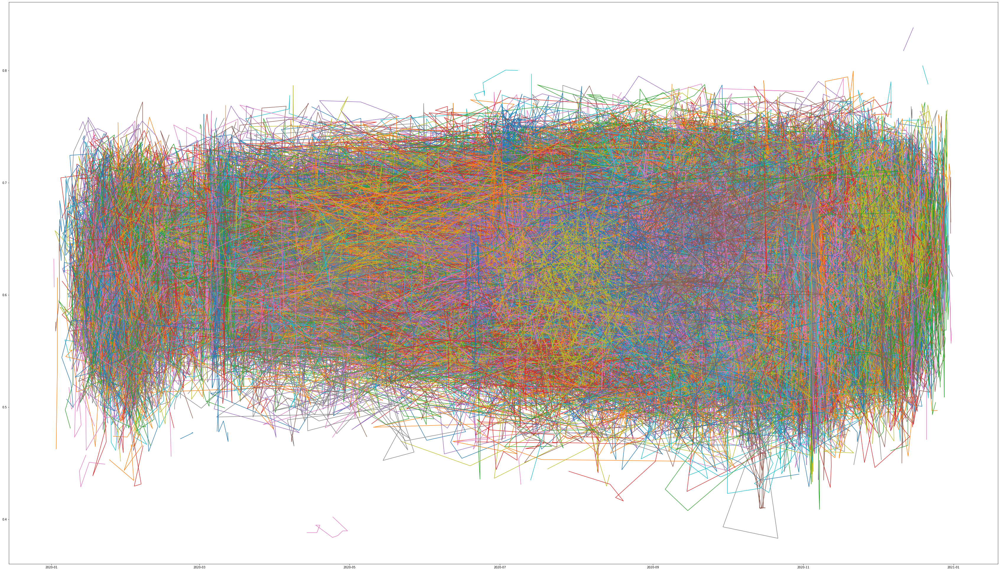

CPU times: user 4min 14s, sys: 7.8 s, total: 4min 22s
Wall time: 4min 17s


In [ ]:
%%time
fig1 = plt.figure(figsize=(60, 35))
from matplotlib import dates
import datetime

occurrences = dict(comments_df_sorted.author.value_counts())

ax1 = fig1.add_subplot()
colormap = plt.cm.gist_ncar #nipy_spectral, Set1,Paired   
colors = [colormap(i) for i in np.linspace(0, 1,len(ax1.lines))]
for i,j in enumerate(ax1.lines):
    j.set_color(colors[i])

Start_from = 0

for user in tqdm(sorted(occurrences.keys()), position=0, leave=True):
  coordinats = list()
  timestep = list()
  for index, row in comments_df_sorted.iloc[Start_from: Start_from+occurrences[user]].iterrows():
    coordinats.append(row.similarity)
    timestep.append(row.created_utc)
  
  Start_from += occurrences[user]

  s = moving_average(timestep, n=5) #Bad to calculate time average
  dts = list(map(datetime.datetime.fromtimestamp, s))
  plt.plot(dts, moving_average(coordinats, n=5))


plt.show()

# Clustering

Give the number of clusters

In [13]:
n_clusters = 2

Dataset labeling based on clustering

In [14]:
kmean_model = KMeans(n_clusters=n_clusters, random_state=12345)
kmean_model.fit(list(comments_df_sorted['embedding']))
comments_df_sorted['label'] = kmean_model.labels_
centroids = kmean_model.cluster_centers_
print(kmean_model.inertia_)

69200516.97117725


In [19]:
with open('comments_df_labeled.pickle', 'wb') as f:
  pickle.dump(comments_df_sorted, f)

Reducing dimension of embeddings and plot graphs of clusters

In [16]:
def plot_2d_representation_of_comments(
    data, 
    flip_x_axis = False,
    flip_y_axis = False,
    label_x_axis = "x",
    label_y_axis = "y", 
    label_label = "label"):
    
    pca = PCA(n_components = 2)
    
    word_vectors = list(data['embedding'])
    word_plus_coordinates = pd.DataFrame(word_vectors)
    
    labels = data['label'].reset_index(drop=True)
    
    coordinates_2d = pca.fit_transform(word_plus_coordinates)
    coordinates_2d = pd.DataFrame(coordinates_2d, columns=[label_x_axis, label_y_axis])
    coordinates_2d = pd.concat([coordinates_2d, labels], axis=1)
 
    if flip_x_axis:
        coordinates_2d[label_x_axis] = \
        coordinates_2d[label_x_axis] * (-1)
    if flip_y_axis:
        coordinates_2d[label_y_axis] = \
        coordinates_2d[label_y_axis] * (-1)
            
    plt.figure(figsize = (15,10))
    p1=sns.scatterplot(data=coordinates_2d, x=label_x_axis, y=label_y_axis, hue=label_label)
    
    x = coordinates_2d[label_x_axis]
    y = coordinates_2d[label_y_axis]
    
    plt.show()

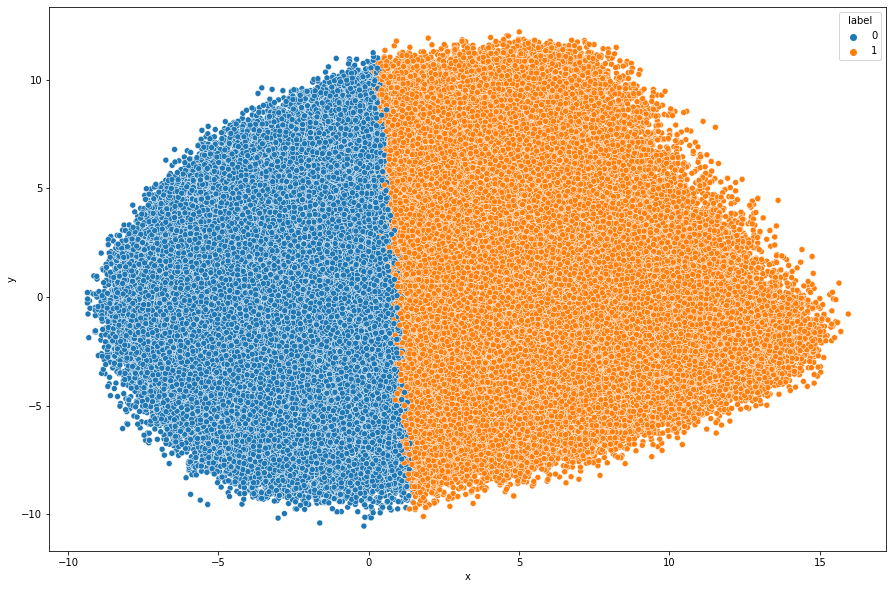

Wall time: 15min 49s


In [17]:
%%time
plot_2d_representation_of_comments(comments_df_sorted)